In [18]:
"""
Multimodel analsysis on CMIP6 data Heatbudget
"""

'\nMultimodel analsysis on CMIP6 data Heatbudget\n'

In [1]:
import xarray as xr
import dask
import matplotlib.pyplot as plt
import numpy as np
import os


import matplotlib as mpl
import scipy
import glob as glob
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import calendar
from scipy.stats import iqr

In [2]:
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/CMIP6_HB/'
#dict with file names
varis = {'dTdt':'_temp_tendency.nc', 'ua':'_u_advection.nc', 'va':'_v_advection.nc',
             'wa':'_w_advection.nc', 'q':'_qnet.nc'}
models={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #put into dict
                mod[key]=var
            except Exception as e:
                print(e)
                pass
        #now append data to model dict
        models[model] = mod



In [3]:
#now lets go through each model and produce and save a plot of the HB terms for Jan and July
def plot_background(ax, i, j):
    #for use with plotting 12 months. need to change 
    ax.set_extent([30., 125., -20., 20.])
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.5)
    ax.add_feature(cfeature.LAND)
    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    if i == 1:
        gl.bottom_labels = True
    else:
        gl.bottom_labels = False
    if j > 0:
        gl.left_labels = False
    return ax

def plot_(dict_name, minv, maxv):
    fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(20, 4), sharey='all', sharex='all', 
                             subplot_kw={'projection':ccrs.PlateCarree()})
    #unpack dict
    for num, key in enumerate(dict_name.keys()):
        var = dict_name[key]
        lons = var.lon
        lats = var.lat
        #dTdt
        axes[0,num].set_title(key)
        axi=0
        for i in [0, 6]:
            if i ==6:
                j = 1
            else:
                j = 0
            axes[j, num].pcolormesh(lons, lats, var.sel(month = (i+1)), 
                                #levels = 41, 
                                cmap = 'RdBu_r', 
                                #add_colorbar=True, 
                                vmin = minv, vmax = maxv, 
                                transform=ccrs.PlateCarree())
                
            plot_background(axes[j, num], j, num)
            axi=axi+1
    cbar_ax2 = fig.add_axes([0.95, 0.3, 0.01, 0.4])
    cmap2 = plt.cm.RdBu_r
    bounds = np.linspace(minv, maxv, 41)
    norm2 = mpl.colors.BoundaryNorm(bounds, cmap2.N)
    cb = mpl.colorbar.ColorbarBase(cbar_ax2, cmap=cmap2, norm=norm2,
        spacing='proportional', boundaries=bounds)
    axes[0, 0].text(-1.7,0.5, 'Jan')
    axes[1, 0].text(-1.7,0.5, 'July')
    #fig.tight_layout()
    return fig

In [4]:
#calculate residual, reverse sign on advection
models1={}
for model in models.keys():
    try:
        HB=models[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = T-Q+U+V+W
        #repack dict
        HB1={'dTdt':T, 'ua':-U, 'va':-V,'wa':-W, 'q':Q, 'res':resid}
        models1[model]=HB1
    except Exception as e:
        print(e, model)
    
    

<ipython-input-12-66acc0fa97b2>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(20, 4), sharey='all', sharex='all',


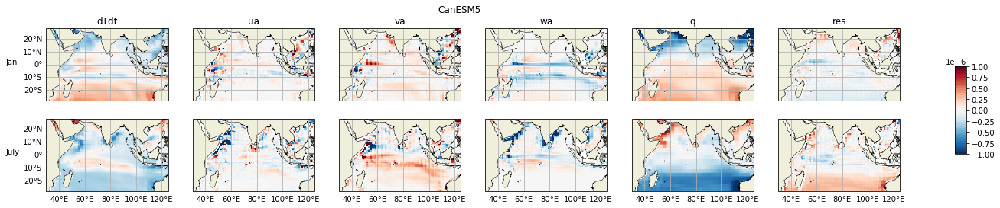

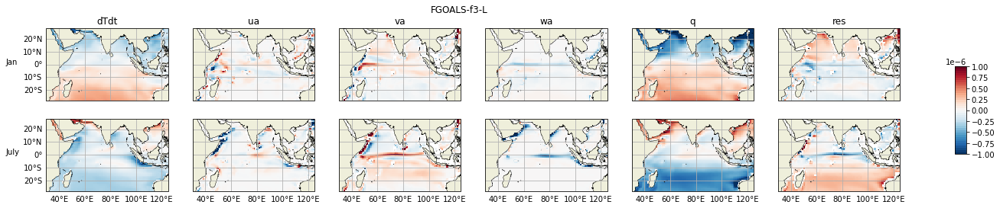

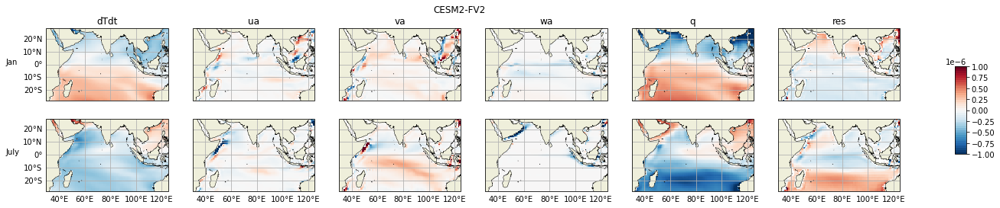

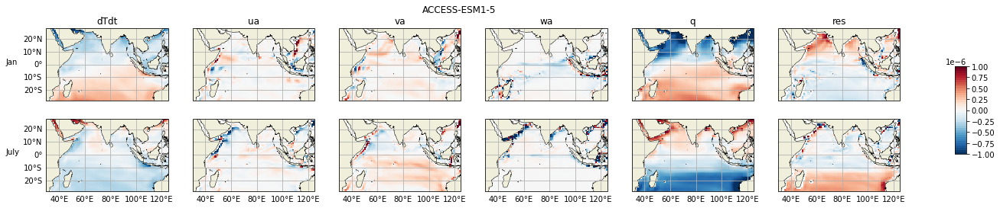

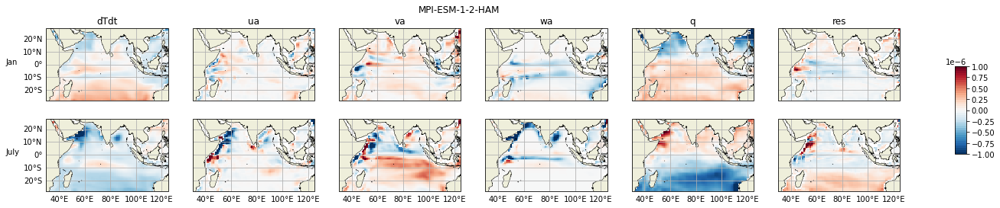

...

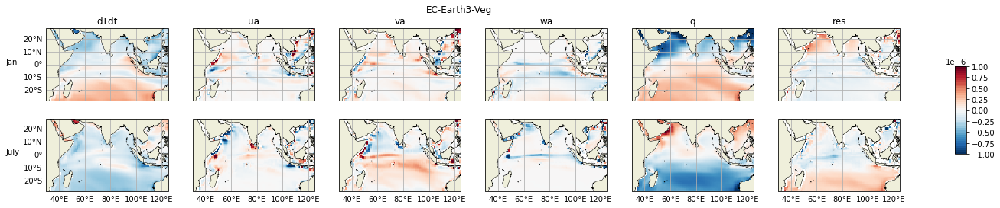

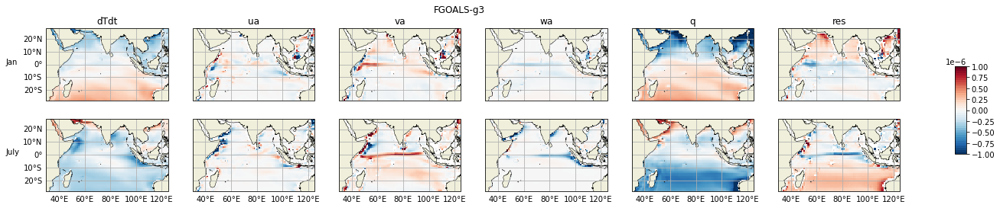

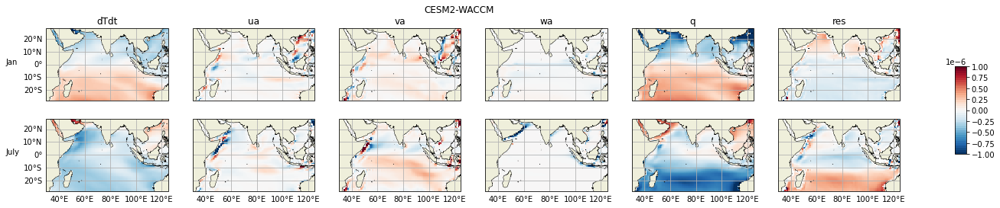

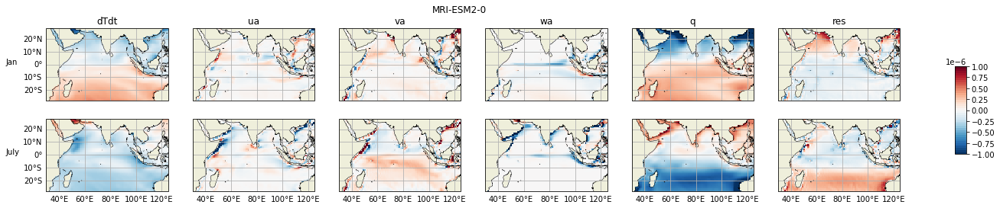

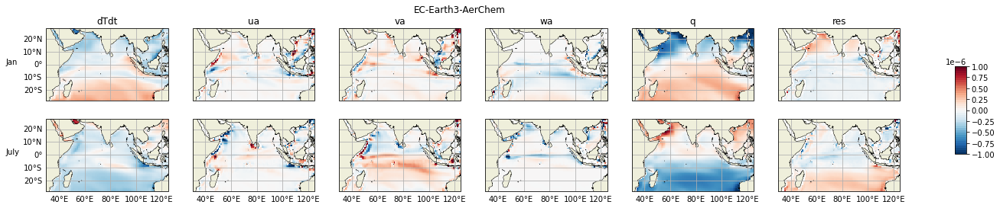

In [14]:
for model in models1.keys():
    try:
        fig = plot_(models1[model], -1e-6, 1e-6)
        fig.set_facecolor("w")
        fig.suptitle(model)
        fig.savefig('/home/z5113258/Documents/figures/multi_model/'+model+'.png')
    except Exception as e:
        print(e)

In [5]:
models1.keys()

dict_keys(['CanESM5', 'FGOALS-f3-L', 'CESM2-FV2', 'ACCESS-ESM1-5', 'MPI-ESM-1-2-HAM', 'CAMS-CSM1-0', 'CESM2', 'GODAS', 'EC-Earth3-Veg-LR', 'MPI-ESM1-2-HR', 'SODA3.4.2', 'EC-Earth3-CC', 'CMCC-CM2-HR4', 'ORAS5', 'MPI-ESM1-2-LR', 'EC-Earth3', 'CESM2-WACCM-FV2', 'ACCESS-CM2', 'EC-Earth3-Veg', 'FGOALS-g3', 'CESM2-WACCM', 'MRI-ESM2-0', 'EC-Earth3-AerChem'])

In [6]:
#create composite of models for each varibale and stipple on sign agreement

In [6]:
tm=[]
um=[]
vm=[]
wm=[]
qm=[]
rm=[]
for model in models1.keys():
    try:
        #unpack all vars
        HB = models1[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = HB['res']
        ##now pack into above lists
        tm.append(T)
        um.append(T)
        vm.append(V)
        wm.append(W)
        qm.append(Q)
        rm.append(resid)
    except Exception as e:
        print(e)

In [7]:
def get_region(da, lat, lat_r, lon, lon_r):
    DA_ss = da.sel(lat=slice(lat, lat_r),lon=slice(lon, lon_r)).mean(['lat', 'lon'])
    return DA_ss

In [9]:
#fucntion to create regional plots for multimodel mean of each variable
def plot_region_MM(MM_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = HB['res']
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            VM = V
            WM = W
            QM = Q
            RM = resid
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
            VM = xr.concat([VM, V], dim = 'model')
            WM = xr.concat([WM, W], dim = 'model')
            QM = xr.concat([QM, Q], dim = 'model')
            RM = xr.concat([RM, resid], dim = 'model')
    #Now calculate the multimodel means/
    TMM = TM.median(dim = 'model')
    UMM = UM.median(dim = 'model')
    VMM = VM.median(dim = 'model')
    WMM = WM.median(dim = 'model')
    QMM = QM.median(dim = 'model')
    RMM = RM.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(18, 4), sharey='all', sharex='all')
    axes[0].plot(range(1,13), get_region((TMM*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
    axes[1].plot(range(1,13), get_region((QMM*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
    axes[2].plot(range(1,13), get_region((UMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
    axes[3].plot(range(1,13), get_region((VMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
    axes[4].plot(range(1,13), get_region((WMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
    axes[5].plot(range(1,13), get_region((RMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')
    #axes[5].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[3].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[4].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[5].axhline(0, c='k', ls = '--', lw = 0.5)

    #now plot ranges
    axes[0].fill_between(range(1,13), get_region(((TM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((TM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'Temperature tendency')
    axes[1].fill_between(range(1,13), get_region(((QM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((QM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'Qnet')
    axes[2].fill_between(range(1,13), get_region(((UM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((UM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'U advection')
    axes[3].fill_between(range(1,13), get_region(((VM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((VM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'V Advection')
    axes[4].fill_between(range(1,13), get_region(((WM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((WM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'W advection')
    axes[5].fill_between(range(1,13), get_region(((RM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((RM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'Residual')
    axes[0].set_title('$dT/dt$')
    axes[1].set_title('$Q_{net}$')
    axes[2].set_title('$Advection_{u}$')
    axes[3].set_title('$Advection_{v}$')
    axes[4].set_title('$Advection_{w}$')
    axes[5].set_title('$Residual$')

    return fig

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

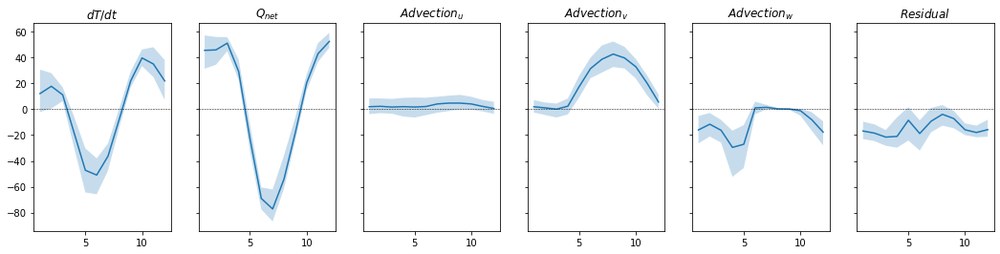

In [44]:
a = plot_region_MM(models1,-12, -5, 50,70)#Thermocline Ridge

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

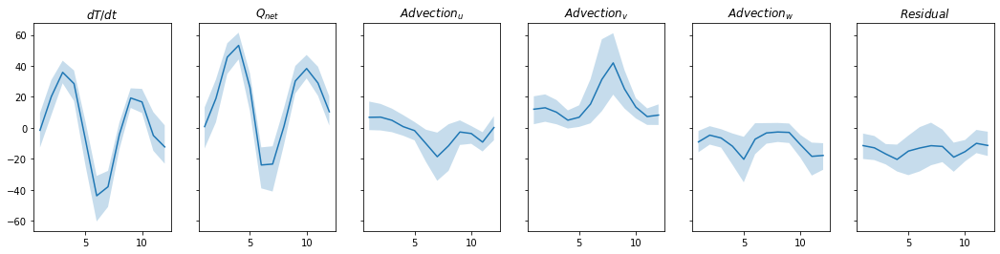

In [11]:
a = plot_region_MM(models1,-10, 10, 50,70)#WTIO

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

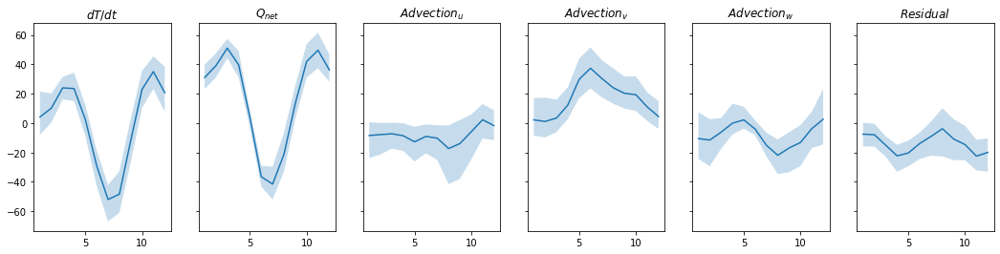

In [12]:
a = plot_region_MM(models1,-10, 0, 90,110)#SETIO

In [13]:
len(models1)

20

In [14]:
#lets calculate an intermodel correlation of DJF u advection to temperature, 
#then we can craete a fucntion to do this for any seasona and variable

In [8]:
from scipy.stats import pearsonr
def correlate_1d(ts1, ts2):
    return pearsonr(ts1, ts2)
import xskillscore as xs

In [9]:
def corr_MM(MM_D, v1, v2):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB[v1]
        U=HB[v2]

        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
    #now we can do an intermodel correlation for different time periods
    c = xs.pearson_r(TM, UM, dim = 'model')
    p = xs.pearson_r_p_value(TM, UM, dim = 'model')
    map_proj = ccrs.PlateCarree()
    p = (c.where(p<= 0.05)).where(abs(c)>=0.5).plot.contourf(transform = ccrs.PlateCarree(), col = 'month', col_wrap = 4,
                                  subplot_kws={"projection": map_proj},
                                    levels = [-1, -0.75, -0.5, 0, 0.5,0.75,1]                                                        
    ) 
    for ax in p.axes.flat:
        ax.coastlines()
        ax.gridlines(draw_labels=True)
    p.fig.suptitle('significant (p< 0.05) intermodel \n pearson r Corr '+v1+':'+v2)
    return p
    

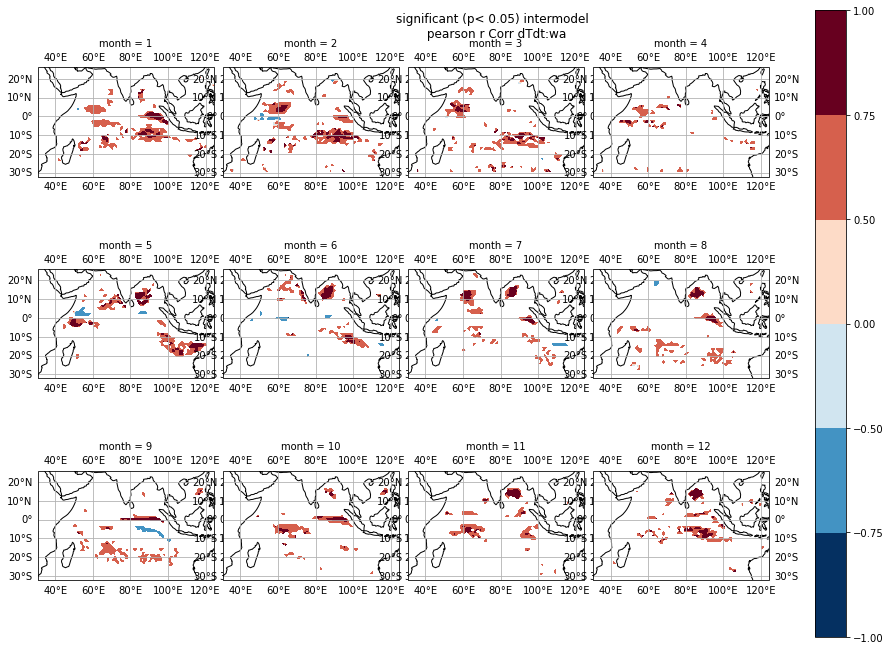

In [12]:
a =  corr_MM(models1, 'dTdt', 'wa')


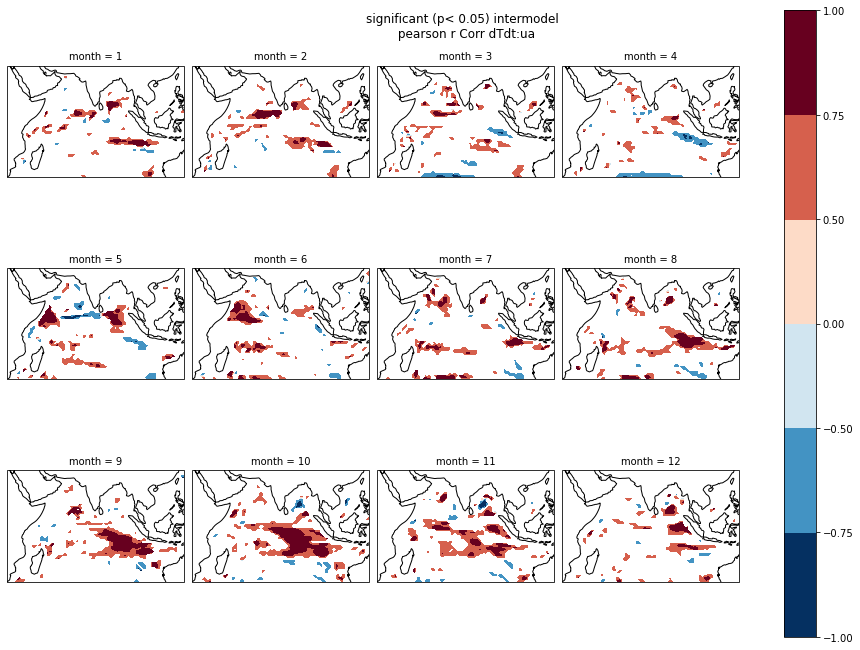

In [48]:
a =  corr_MM(models1, 'dTdt', 'ua')


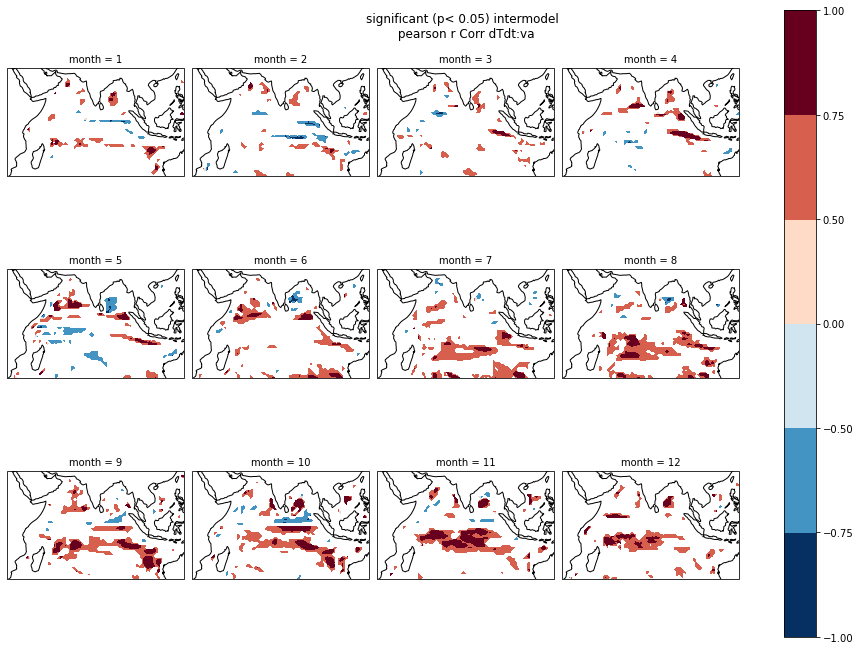

In [49]:
a =  corr_MM(models1, 'dTdt', 'va')


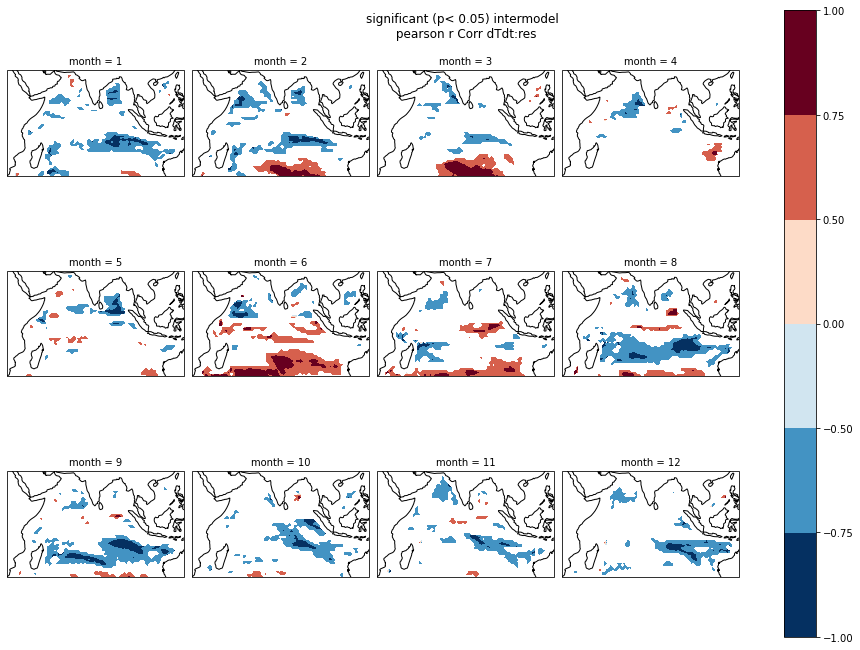

In [50]:
a =  corr_MM(models1, 'dTdt', 'res')


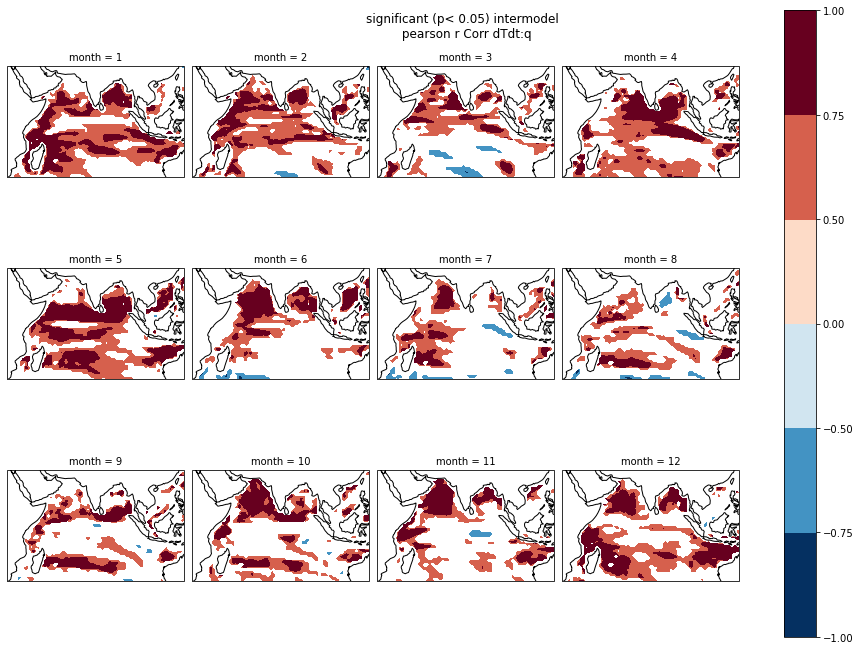

In [51]:
a =  corr_MM(models1, 'dTdt', 'q')


In [10]:
#lets make a month by month panel plot for scatter plots of variables
from scipy.stats import pearsonr

In [11]:
def scatter_corr_MM(MM_D, v1, v2, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB[v1]
        U=HB[v2]
        
        
        #get area avaerage of these
        T = get_region((T*(3986*1026*50)), lat, lat_r, lon, lon_r)
        U = get_region((U*(3986*1026*50)), lat, lat_r, lon, lon_r)
        T = T.assign_coords({"model":model})
        U = U.assign_coords({"model":model})
        
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
    #convert to datset to make a scatetr plot of vars
    DS = xr.Dataset(data_vars=dict(
            TM=(["model", "month"], TM),
            UM=(["model", "month"], UM),),
        coords=dict(
            month=(TM.month),
            model=(TM.model),),
        attrs=dict(description="Dataset of 2 varibales to correlate/scatter plot with"))
    #r = xs.pearson_r(DS['T1'], DS['U1'], dim = 'model')
    #pv = xs.pearson_r_eff_p_value(DS['T1'], DS['U1'], dim = 'model')
    #now we can make a scatter plot of the strenght of the terms for each month
    #make size array for 20 models
    size = [1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,]
    #DS = DS.assign_coords({'sz':size})
    p = DS.plot.scatter(x='TM', y='UM', col = 'month', col_wrap = 3, 
                hue =  'model', hue_style="discrete")
    #calculate correlation coefficient
    
    for i, ax in enumerate(p.axes.flat):
        if i in [0,3,6,9]:
            ax.set_ylabel(v2)
        if i in [9,10,11]:
            ax.set_xlabel(v1)
        #ax.set_title((str('r = '), r.values[i]))
    return p

Text(0.5, 0.98, 'Eastern Thermocline Ridge (-15, -5, 80,100)')

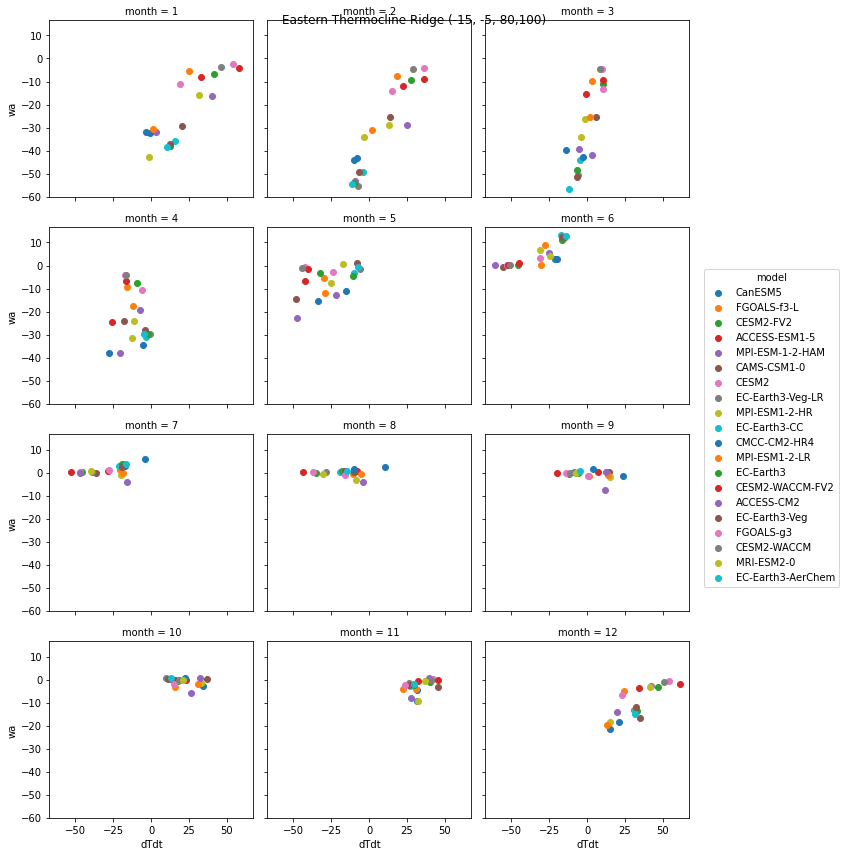

In [14]:
a = scatter_corr_MM(models1, 'dTdt', 'wa', -15, -5, 80,100)#Eastern Thermocline Ridge
a.fig.suptitle('Eastern Thermocline Ridge (-15, -5, 80,100)')
#a.fig.tight_layout()

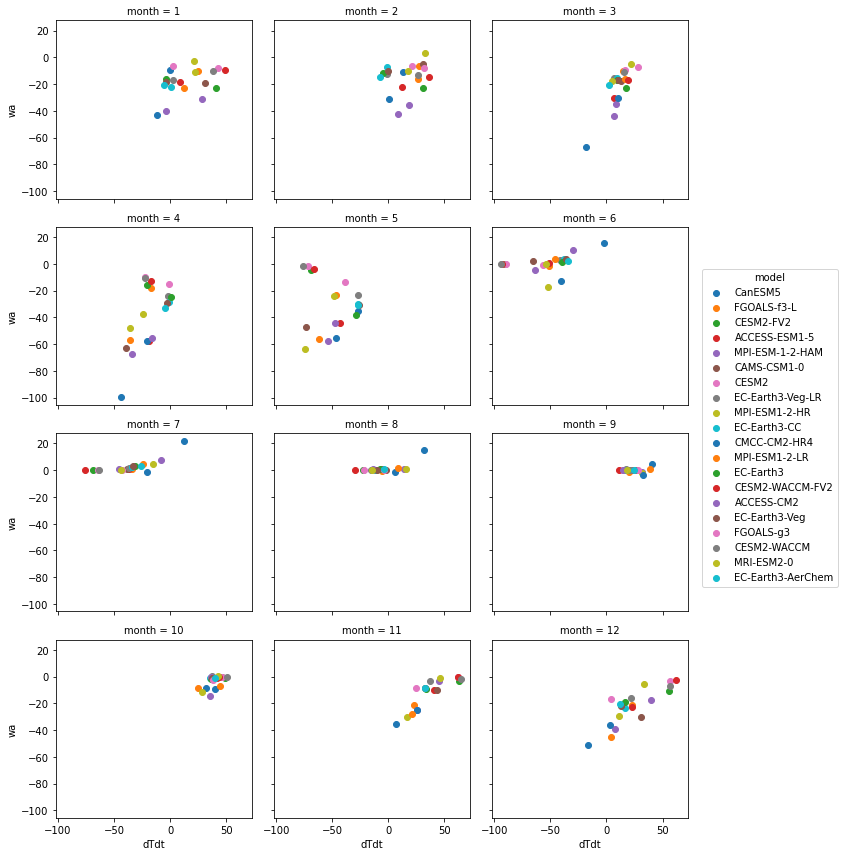

In [40]:
a = scatter_corr_MM(models1, 'dTdt', 'wa', -12, -5, 50,70)# Thermocline Ridge

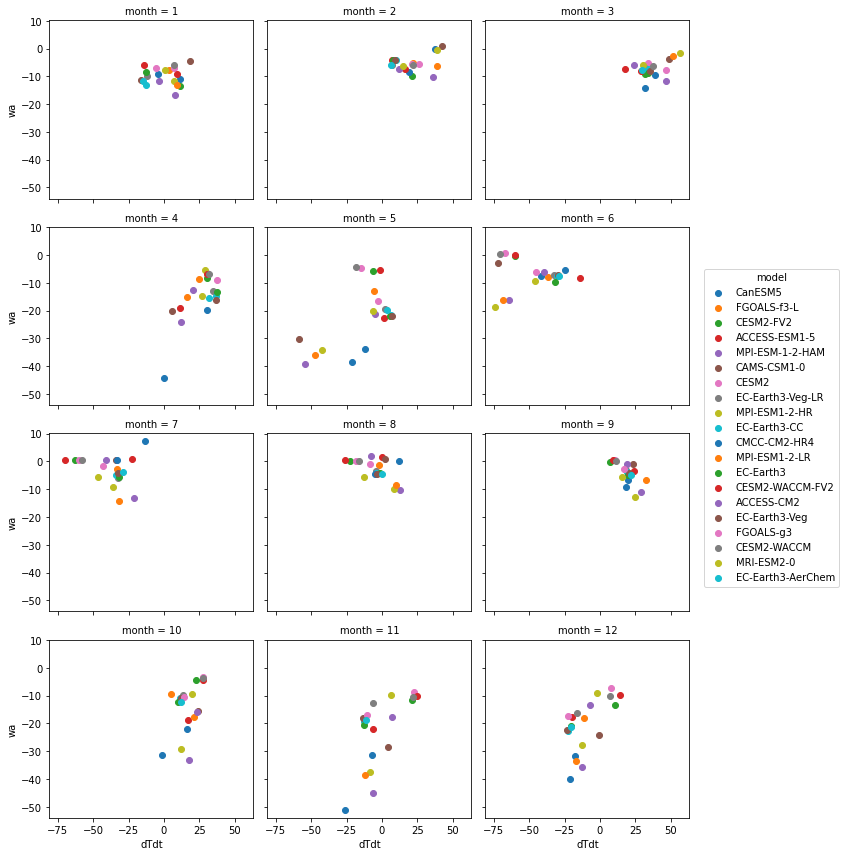

In [42]:
a = scatter_corr_MM(models1, 'dTdt', 'wa', -10, 10, 50,70)#WTIO

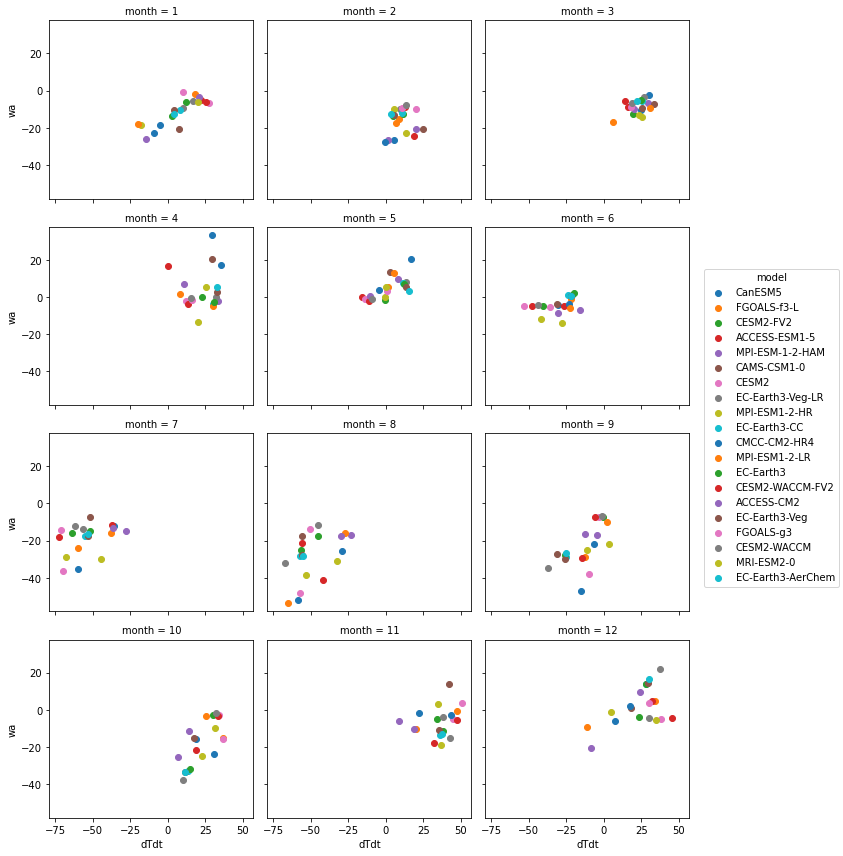

In [39]:
a = scatter_corr_MM(models1, 'dTdt', 'wa', -10, -0, 90,110)#SETIO

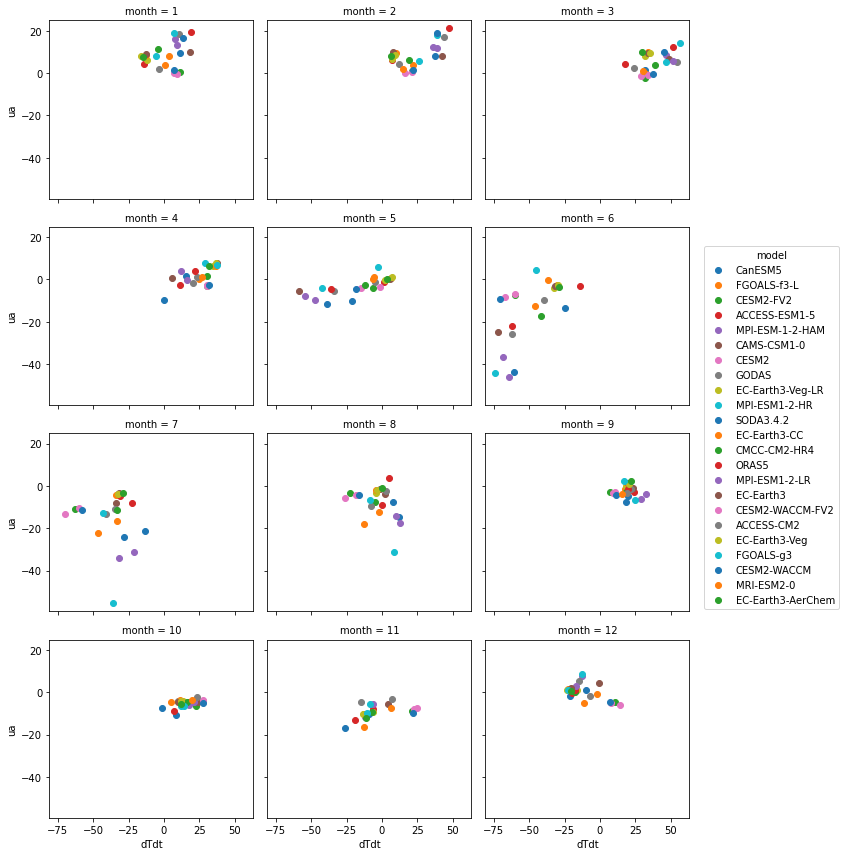

In [12]:
a = scatter_corr_MM(models1, 'dTdt', 'ua', -10, 10, 50,70)#WTIO

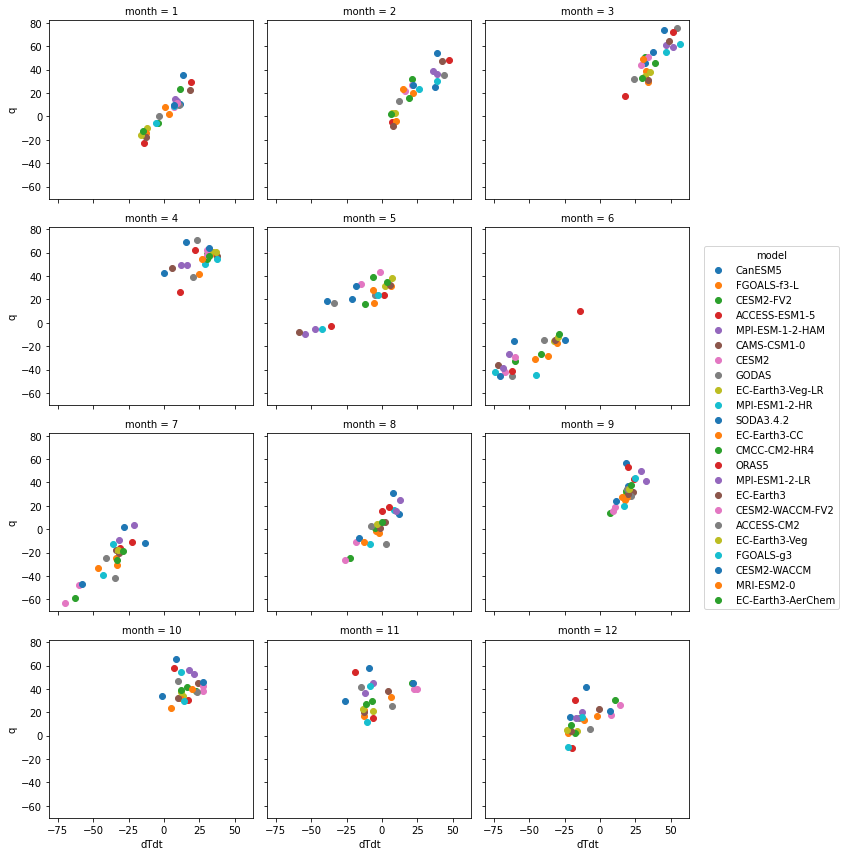

In [16]:
a = scatter_corr_MM(models1, 'dTdt', 'q', -10, 10, 50,70)#WTIO

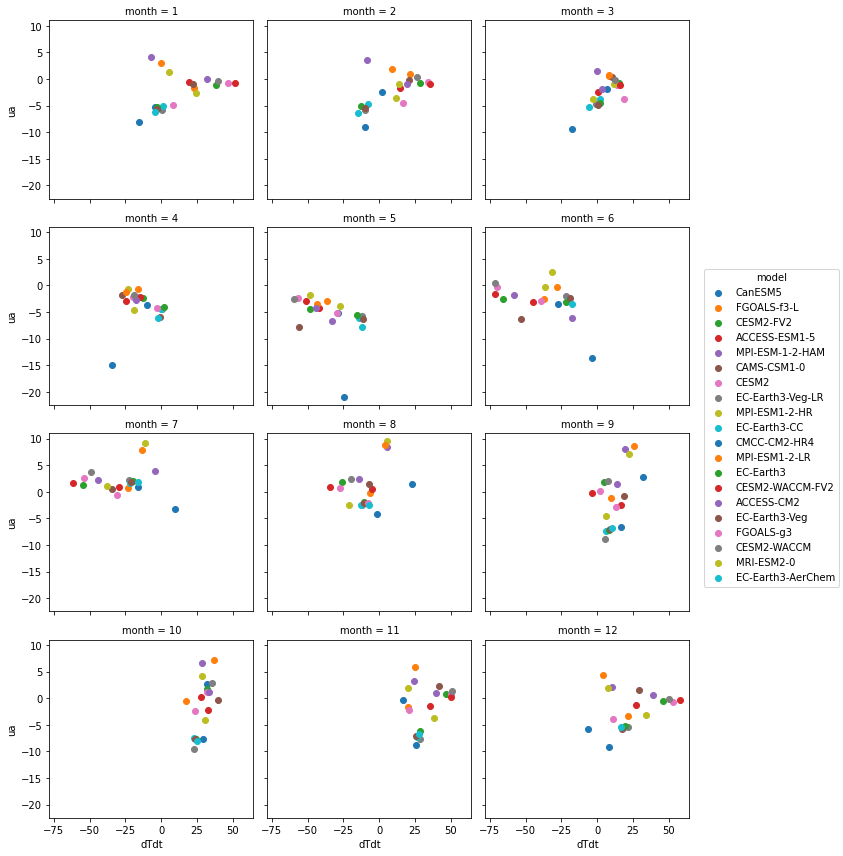

In [47]:
a = scatter_corr_MM(models1, 'dTdt', 'ua', -12, -5, 50,100)#SETIO

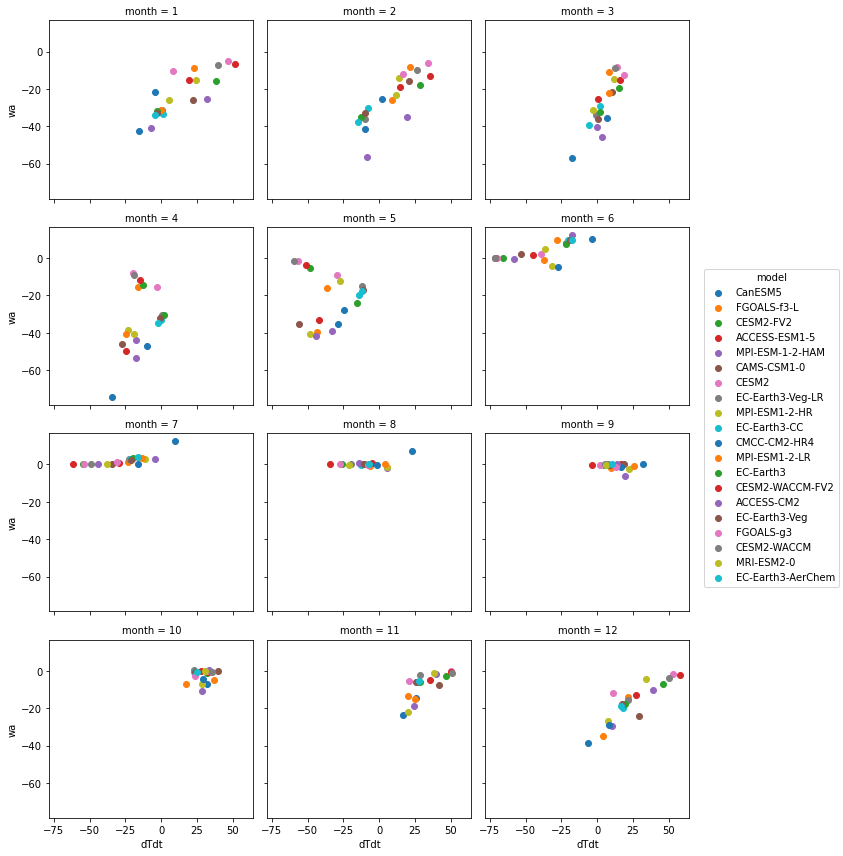

In [48]:
a = scatter_corr_MM(models1, 'dTdt', 'wa', -12, -5, 50,100)#SETIO

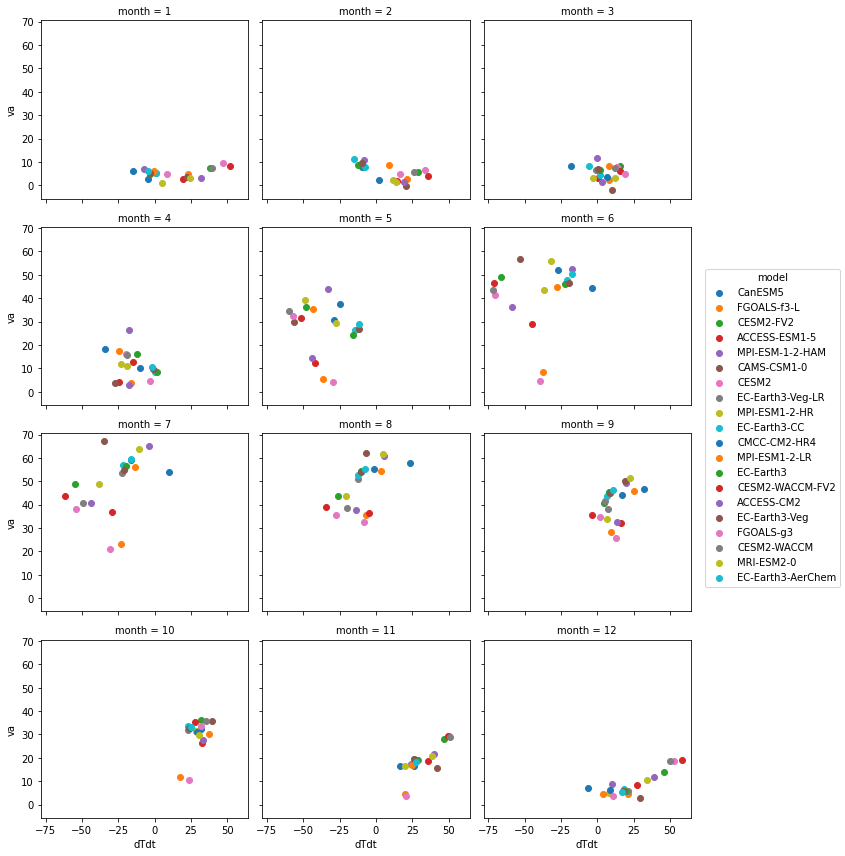

In [49]:
a = scatter_corr_MM(models1, 'dTdt', 'va', -12, -5, 50,100)#SETIO

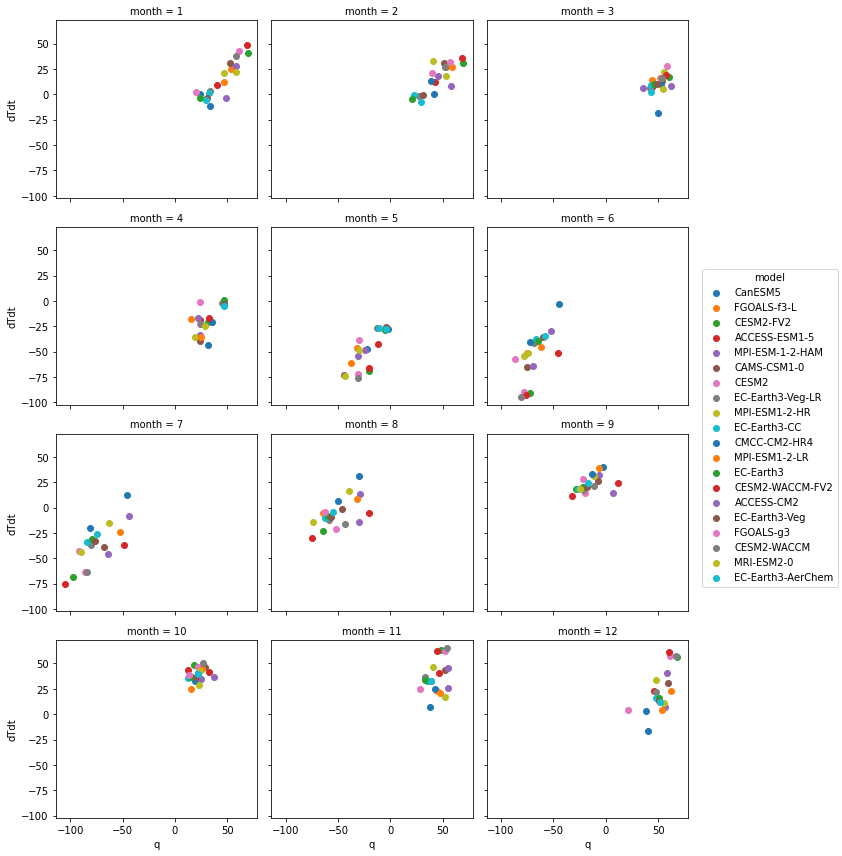

In [54]:
a = scatter_corr_MM(models1, 'q', 'dTdt', -12, -5, 50,70)#SCTR

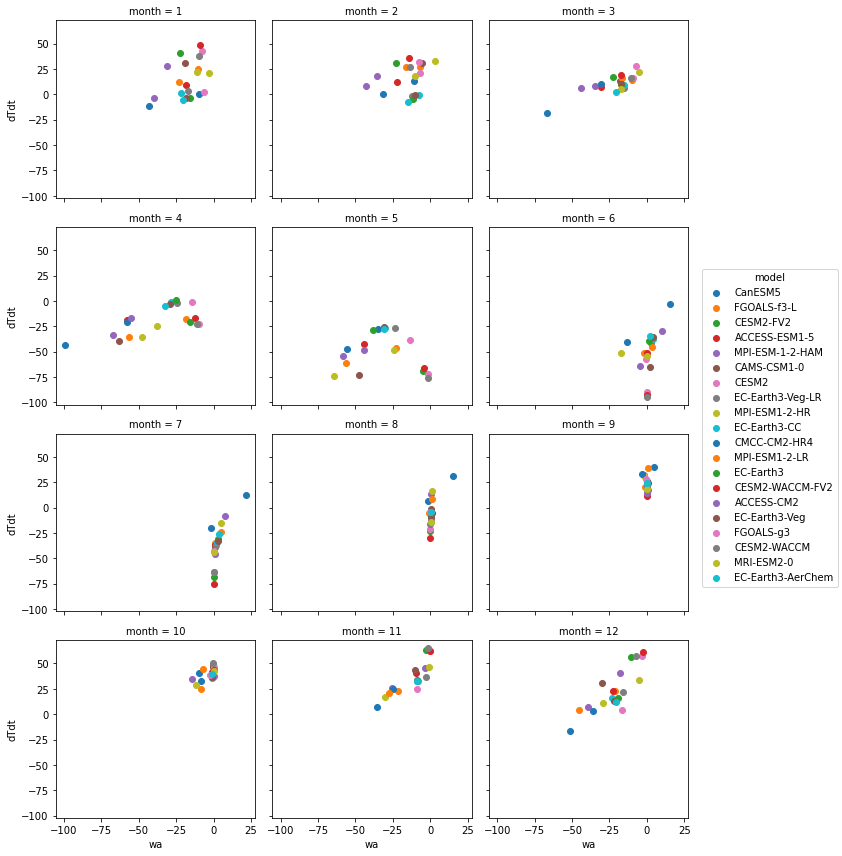

In [135]:
a = scatter_corr_MM(models1, 'wa', 'dTdt', -12, -5, 50,70)#SCTR

In [13]:
def plotMonthly_corr_dt(MDIC, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MDIC.keys()):
        HB = MDIC[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = HB['res']
        T = T.assign_coords({"model":model})
        U = U.assign_coords({"model":model})
        V = V.assign_coords({"model":model})
        W = W.assign_coords({"model":model})
        Q = Q.assign_coords({"model":model})
        resid = resid.assign_coords({"model":model})
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            VM = V
            WM = W
            QM = Q
            RM = resid
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
            VM = xr.concat([VM, V], dim = 'model')
            WM = xr.concat([WM, W], dim = 'model')
            QM = xr.concat([QM, Q], dim = 'model')
            RM = xr.concat([RM, resid], dim = 'model')    
    DS = xr.Dataset(data_vars=dict(
            TM=(["model", "month", "lat", "lon"], TM),
            UM=(["model", "month", "lat", "lon"], UM),
            VM=(["model", "month", "lat", "lon"], VM),
            WM=(["model", "month", "lat", "lon"], WM),
            QM=(["model", "month", "lat", "lon"], QM),
            RM=(["model", "month", "lat", "lon"], RM)),
        coords=dict(
            month=(TM.month),
            model=(TM.model),
            lat = (TM.lat), lon = (TM.lon)),
        attrs=dict(description="Dataset of all heat budget varibales to correlate/scatter plot with"))
    reg =  get_region((DS*(3986*1026*50)), lat, lat_r, lon, lon_r)
    ru = xs.pearson_r(reg['TM'], reg['UM'], dim = 'model').assign_coords({"var":1})
    rv = xs.pearson_r(reg['TM'], reg['VM'], dim = 'model').assign_coords({"var":2})
    rw = xs.pearson_r(reg['TM'], reg['WM'], dim = 'model').assign_coords({"var":3})
    rq = xs.pearson_r(reg['TM'], reg['QM'], dim = 'model').assign_coords({"var":4})
    rr = xs.pearson_r(reg['TM'], reg['RM'], dim = 'model').assign_coords({"var":5})
    pu = xs.pearson_r_p_value(reg['TM'], reg['UM'], dim = 'model').assign_coords({"var":1})
    pv = xs.pearson_r_p_value(reg['TM'], reg['VM'], dim = 'model').assign_coords({"var":2})
    pw = xs.pearson_r_p_value(reg['TM'], reg['WM'], dim = 'model').assign_coords({"var":3})
    pq = xs.pearson_r_p_value(reg['TM'], reg['QM'], dim = 'model').assign_coords({"var":4})
    pr = xs.pearson_r_p_value(reg['TM'], reg['RM'], dim = 'model').assign_coords({"var":5})

    DA1 = xr.concat([ru, rv, rw, rq, rr], dim = "var")
    DA2 = xr.concat([pu, pv, pw, pq, pr], dim = "var")
    DA3 = DA1.where(DA2<=0.05, np.nan)
    #now plot figures
    DA2.where(DA2<=0.05, -1).plot.imshow(cmap = 'Greys_r',add_colorbar = False)#plot black wher eno significant
    DA3.plot.imshow()#plto colors where significant
    plt.yticks([1,2,3,4,5],['$dT/dt$:$Advection_{u}$','$dT/dt$:$Advection_{v}$',
                            '$dT/dt$:$Advection_{w}$','$dT/dt$:$Qnet$','$dT/dt$:$resid$',])#plot variables corerlated
    plt.ylabel(' ')
    plt.title(f"Intermodel Pearson correlation, p<0.05 \n {lon} - {lon_r}E, {lat}-{lat_r}N")
    return

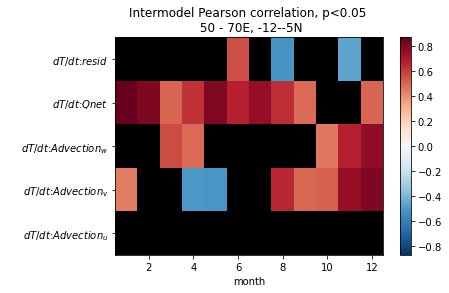

In [14]:
plotMonthly_corr_dt(models1, -12, -5, 50, 70)
#0.05

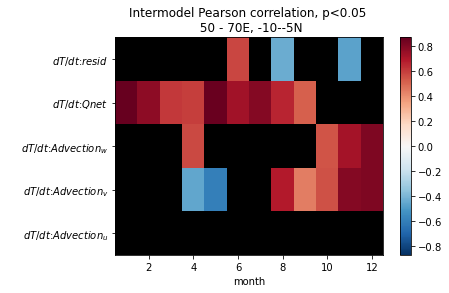

In [15]:
plotMonthly_corr_dt(models1, -10, -5, 50, 70)
#0.1

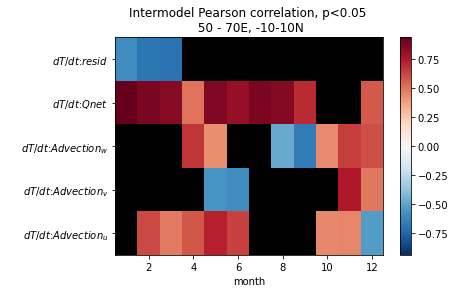

In [14]:
plotMonthly_corr_dt(models1, -10, 10, 50, 70)


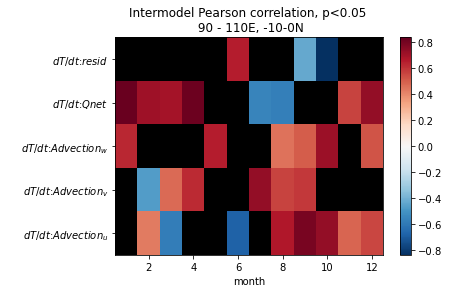

In [17]:
plotMonthly_corr_dt(models1, -10, 0, 90, 110)


In [25]:
datadir = '/home/z5113258/Documents/data/CMIP6_HB/'
#dict with file names
Z20={}
#get all data for temp tendency
varis = '_z20.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        inp_files = (os.path.join(datadir, model, str(model+varis)))
        try:
            #load in file
            var = xr.open_dataarray(inp_files)
            if var.mean() > 1000:
                var = var/100
            #put into dict
        except Exception as e:
            print(e)
            pass
        #now append data to model dict
        Z20[model] = var

In [26]:
Z20 = {key: value for key, value in sorted(Z20.items())}
for i, model in enumerate(Z20.keys()):
    z20 = Z20[model]
    z20 = z20.assign_coords({"model":i})
    if i == 0:
        z20m = z20
    else:
        z20m = xr.concat([z20m, z20], dim = 'model')

In [27]:
Z20.keys()

dict_keys(['ACCESS-CM2', 'ACCESS-ESM1-5', 'CAMS-CSM1-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'CMCC-CM2-HR4', 'CanESM5', 'EC-Earth3', 'EC-Earth3-AerChem', 'EC-Earth3-CC', 'EC-Earth3-Veg', 'EC-Earth3-Veg-LR', 'FGOALS-f3-L', 'FGOALS-g3', 'MPI-ESM-1-2-HAM', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'MRI-ESM2-0'])

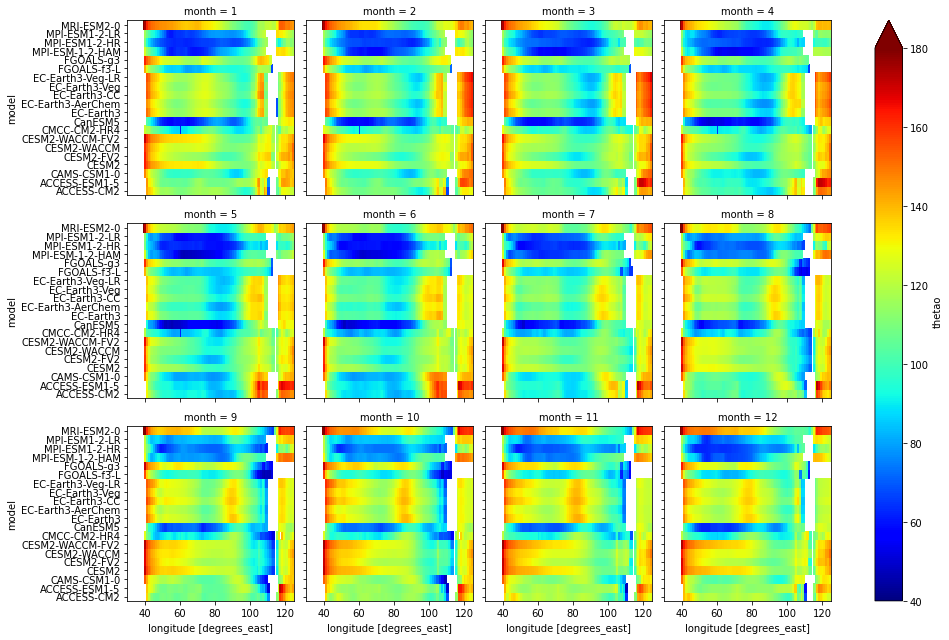

In [33]:
p = z20m.sel(lat=slice(-9,-7)).mean('lat').plot(x = 'lon', y = 'model', col = 'month', 
                                                col_wrap = 4, vmin = 40, vmax = 180, cmap = 'jet')
for i, ax in enumerate(p.axes.flat):
    if i in [0,4,8]:
        ax.set_yticks(range(0,20,1))
        ax.set_yticklabels(list(Z20.keys()))

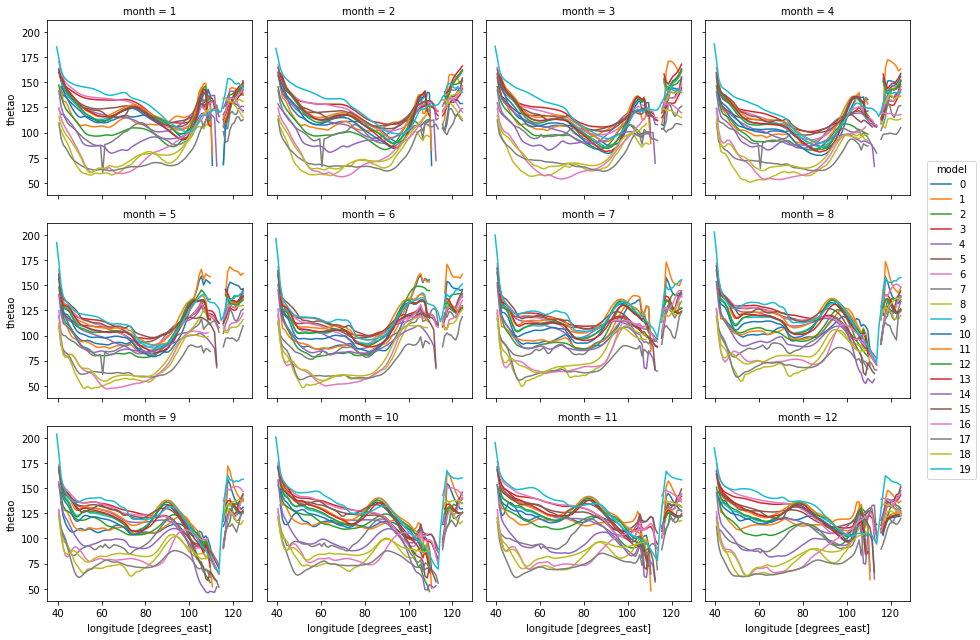

In [199]:
p = z20m.sel(lat=slice(-9,-7)).mean('lat').plot.line(x = 'lon',  col = 'month', col_wrap = 4)
#for i, ax in enumerate(p.axes.flat):
#    if i in [0,4,8]:
#        ax.set_yticks([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,17, 18, 19])
#        ax.set_yticklabels(list(Z20.keys()))

In [191]:
sorted_dict = {key: value for key, value in sorted(models1.items())}

In [192]:
sorted_dict

{'ACCESS-CM2': {'dTdt': <xarray.DataArray 'thetao' (month: 12, lat: 60, lon: 95)>
  array([[[          nan,           nan, ...,           nan,           nan],
          [          nan,           nan, ...,           nan,           nan],
          ...,
          [          nan,           nan, ..., -6.468547e-07, -4.647590e-07],
          [          nan,           nan, ..., -8.115958e-07, -8.091393e-07]],
  
         [[          nan,           nan, ...,           nan,           nan],
          [          nan,           nan, ...,           nan,           nan],
          ...,
          [          nan,           nan, ..., -4.096104e-07, -3.789285e-07],
          [          nan,           nan, ..., -4.882008e-07, -4.616773e-07]],
  
         ...,
  
         [[          nan,           nan, ...,           nan,           nan],
          [          nan,           nan, ...,           nan,           nan],
          ...,
          [          nan,           nan, ..., -6.856306e-07, -5.782944e-07],
 

In [186]:
list(models1.keys())

['CanESM5',
 'FGOALS-f3-L',
 'CESM2-FV2',
 'ACCESS-ESM1-5',
 'MPI-ESM-1-2-HAM',
 'CAMS-CSM1-0',
 'CESM2',
 'EC-Earth3-Veg-LR',
 'MPI-ESM1-2-HR',
 'EC-Earth3-CC',
 'CMCC-CM2-HR4',
 'MPI-ESM1-2-LR',
 'EC-Earth3',
 'CESM2-WACCM-FV2',
 'ACCESS-CM2',
 'EC-Earth3-Veg',
 'FGOALS-g3',
 'CESM2-WACCM',
 'MRI-ESM2-0',
 'EC-Earth3-AerChem']

In [169]:
np.arange(0,20,1)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

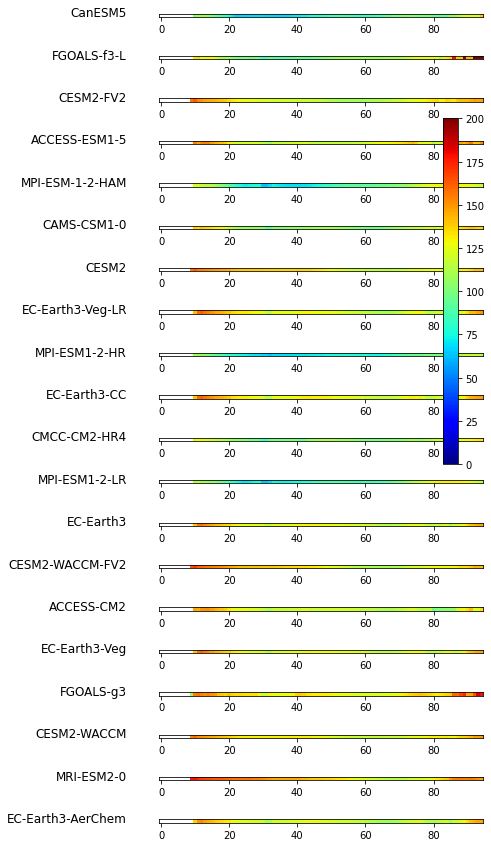

In [154]:
fig = plt.figure(1, figsize=(7,12))
for i, model in enumerate(Z20.keys()):
    z20 = Z20[model]
    ax = plt.subplot(len(Z20.keys()), 1, i+1)
    fill=plt.imshow([z20.sel(lat=slice(-12,-5)).mean('lat').sel(month=1)], vmin=0., vmax=200, cmap = 'jet')#common colorscale on all subplots
    plt.text(-10,0.3, model, ha='right',fontsize=12)
    #plt.ylabel(str(dst.values)[0:4], ha='right', rotation = 0, va='center', fontsize=8)
    plt.yticks([])
    #plt.xticks([])
#plt.subplots_adjust(top=0.96, bottom=0.05, left=0.045, right=0.9, hspace=0.0, wspace=0.09)
fig.subplots_adjust(right=0.9)
plt.tight_layout()
cbar_ax = fig.add_axes([0.9, 0.45, 0.03, 0.4])
fig.colorbar(fill, cax=cbar_ax)
#plt.xticks(range(0, 12, 1), ('J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'),fontsize=8)
#plt.subplot(len(DMI_sorted), 2, 1) #to get the firts plot and tittle above it
#plt.title('(a) DMI')

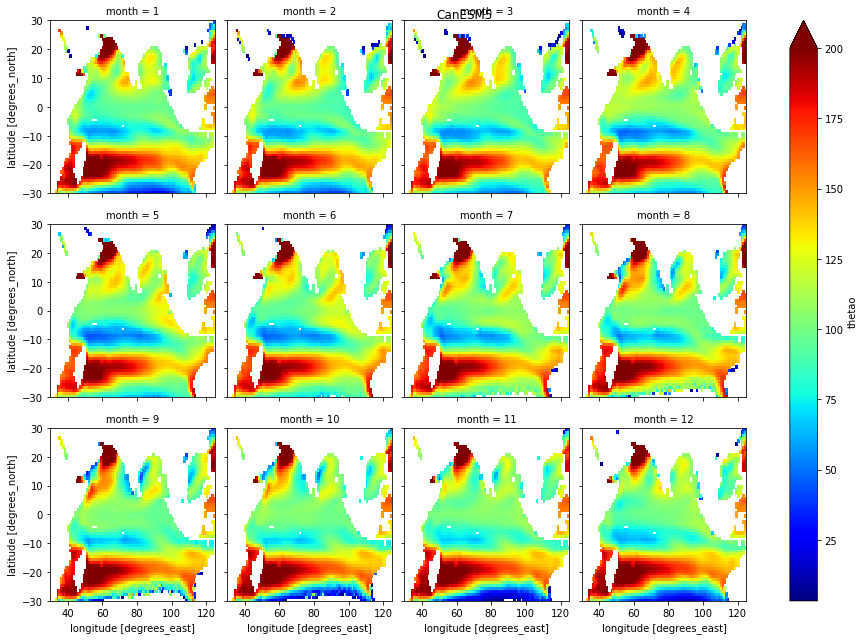

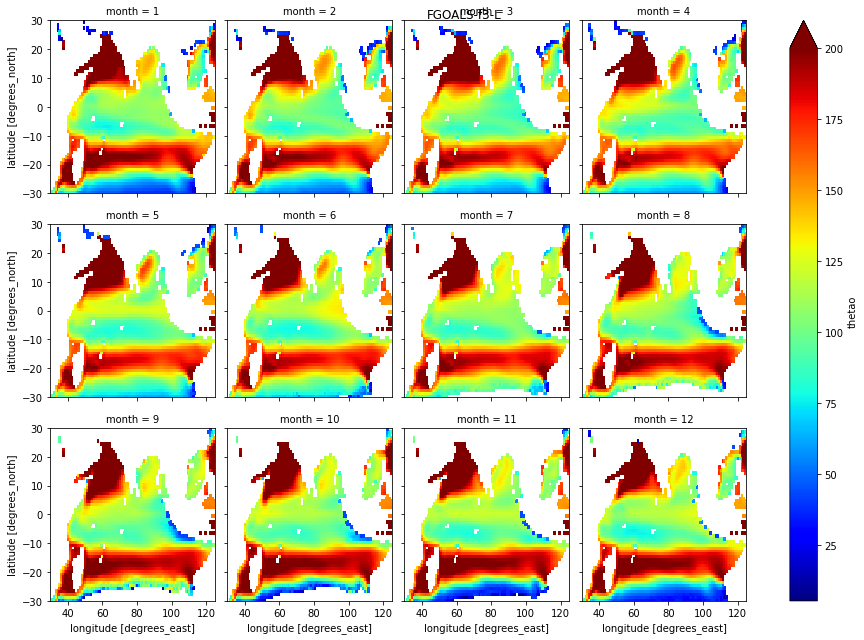

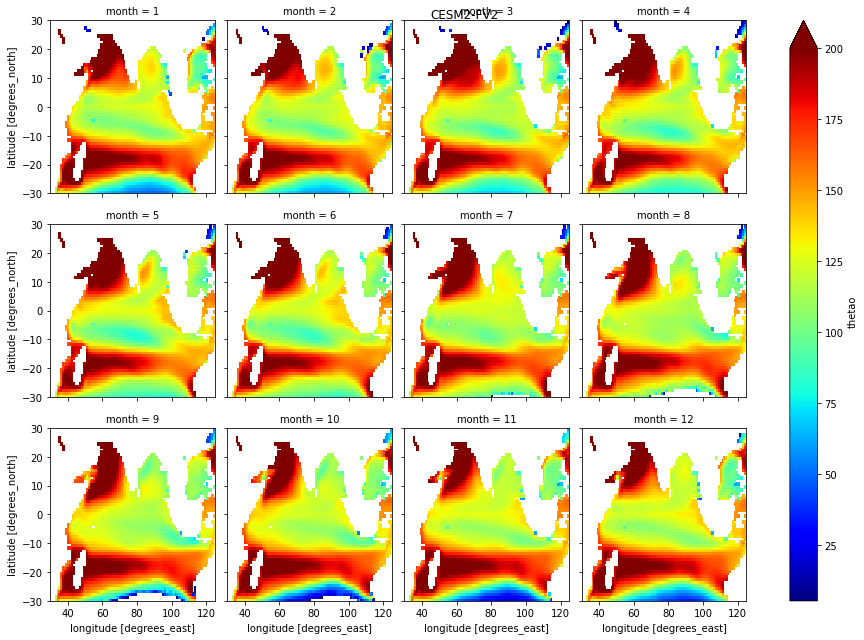

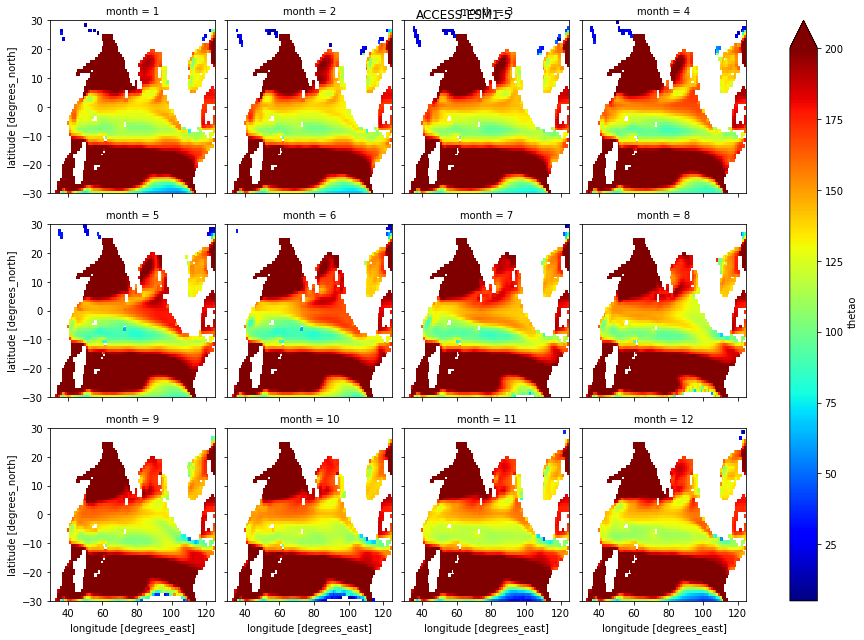

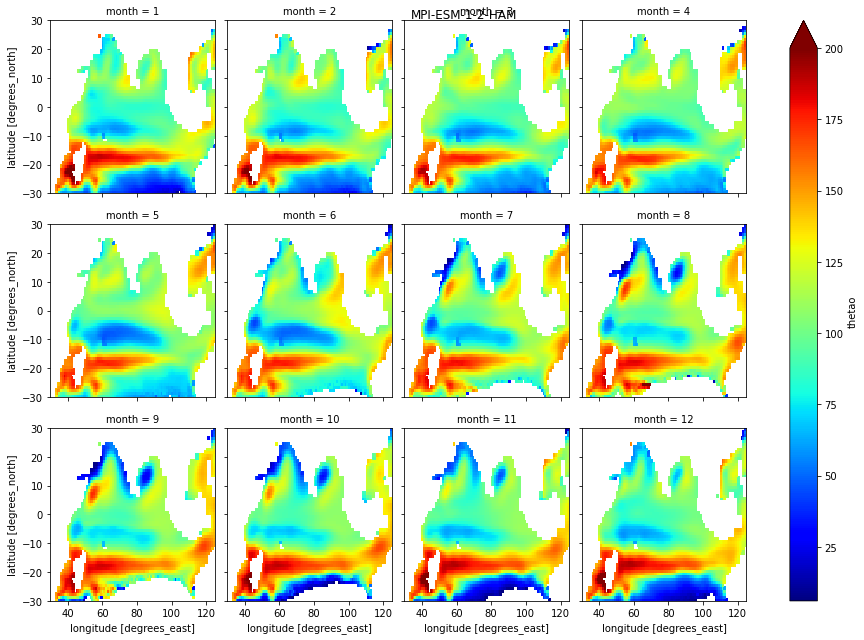

...

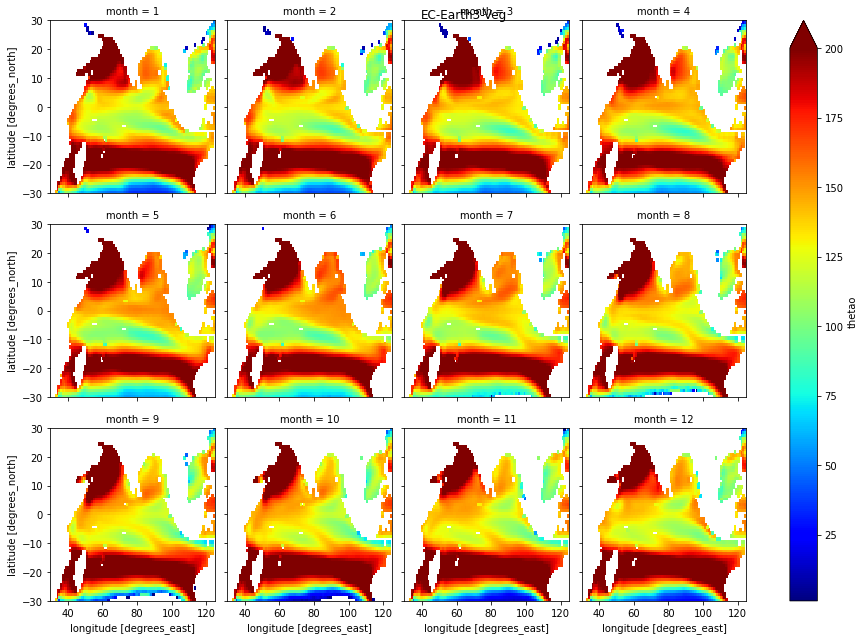

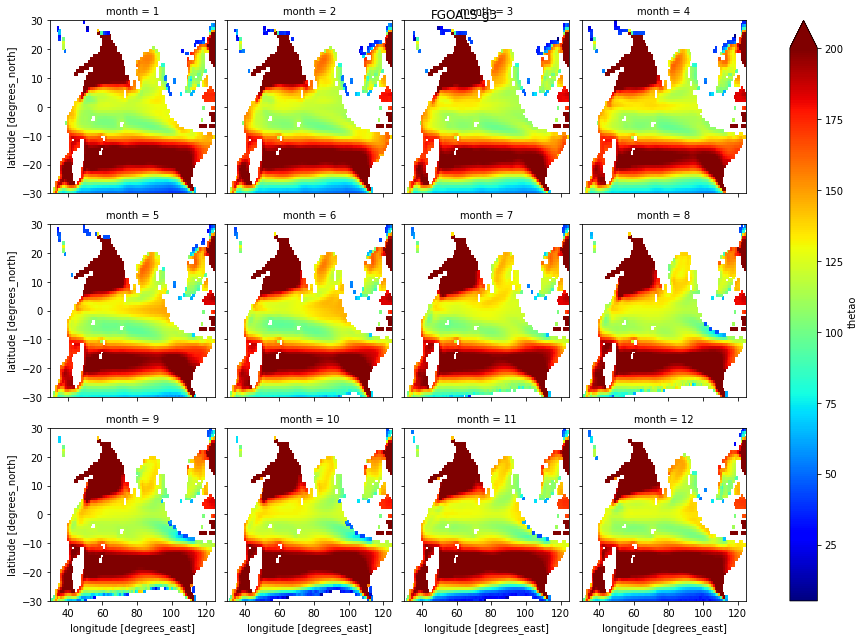

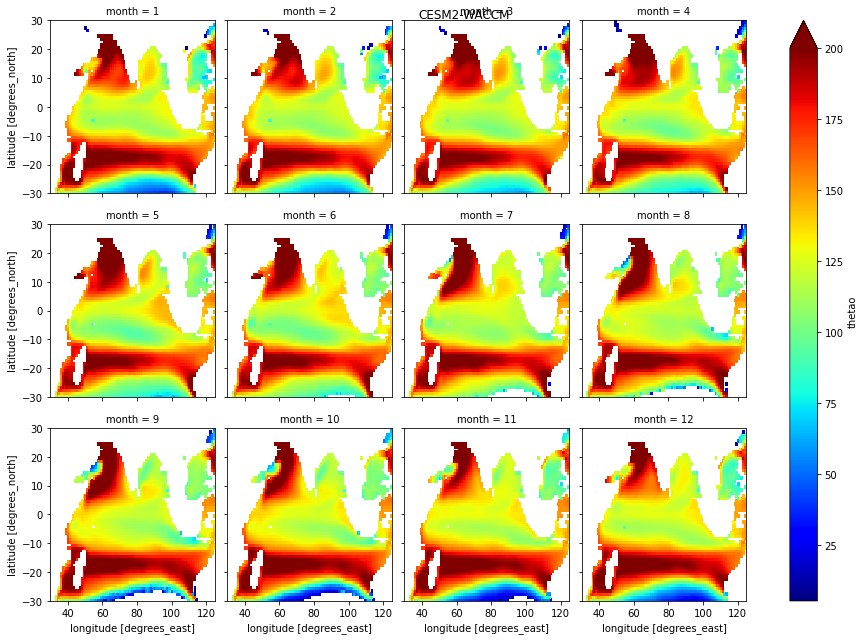

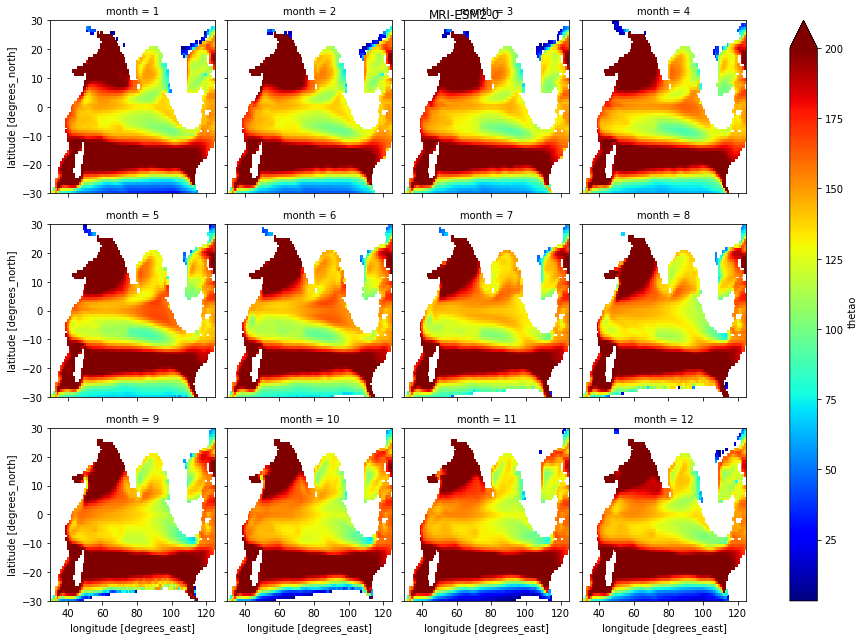

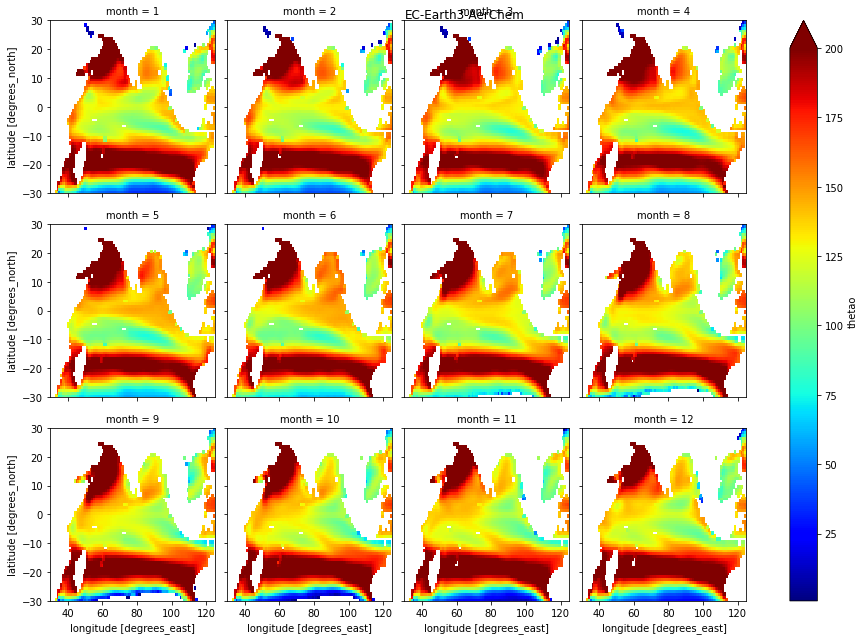

In [29]:
for mod in Z20.keys():
    tc = Z20[mod]
    P = tc.plot(col='month', col_wrap = 4, vmax = 200, cmap = 'jet')
    P.fig.suptitle(mod)

In [66]:
for i, model in enumerate(Z20.keys()):
    z20 = Z20[model]
    #z20 = z20.assign_coords({"model":model})
    if i == 0:
        z20m = z20
    else:
        z20m = xr.concat([z20m, z20], dim = 'model')

In [71]:
test = z20m.sel(lat = slice(-8, -4)).mean('lat')

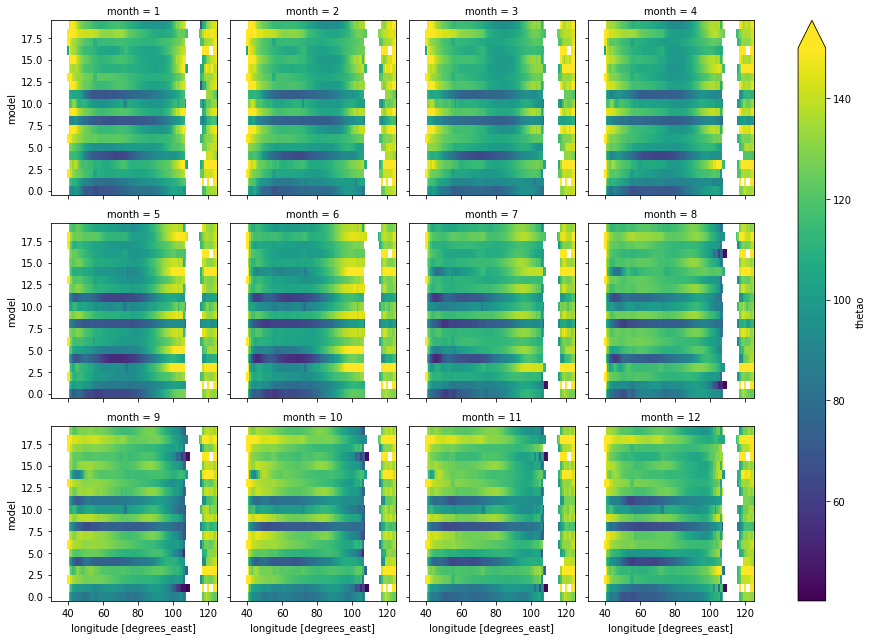

In [72]:
test.plot.imshow(x = 'lon', y = 'model', col = 'month', col_wrap = 4, vmax = 150)

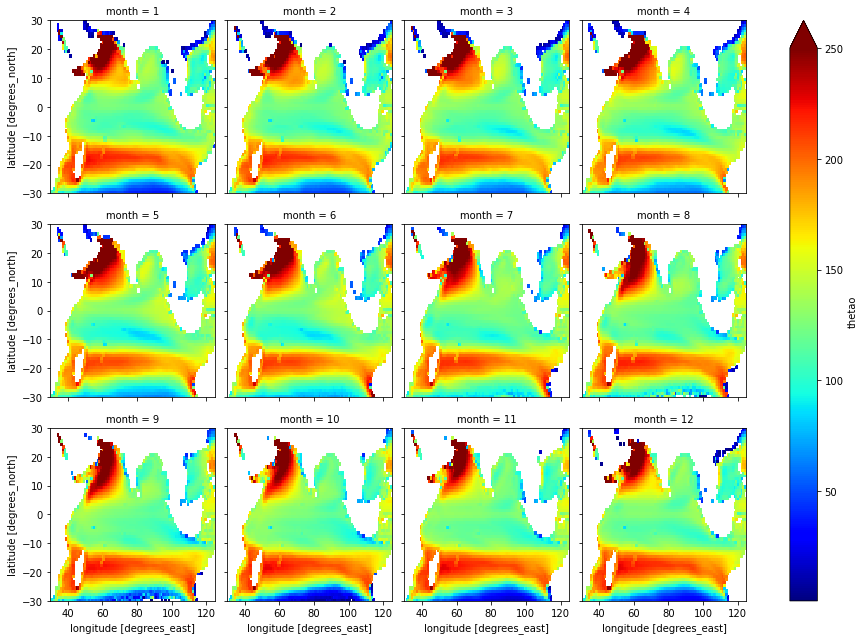

In [50]:
z20m.median('model').plot(col='month', col_wrap = 4, cmap = 'jet', vmax = 250)